In [57]:
# Visualize Spatial data (EDA) 

In [3]:
from glob import glob
import os
# from netCDF4 import Dataset
import pandas as pd
import geopandas as gpd #
from shapely.geometry import Polygon, LineString, Point
import rasterio
from rasterio.plot import show
# from rasterio.transform import from_origin
from rasterstats import zonal_stats
import matplotlib.pyplot as plt
import cv2
import numpy as np
import geopandas as gpd
import tqdm

root_path = '/kaggle/input'

In [4]:
# Read rasterfile
bio_raster_path_list = glob(root_path + '/climateclef/Climate/BioClimatic_Average_1981-2010/*.tif')
climatic_raster_path_list = glob(root_path + '/climateclef/Climate/Climatic_Monthly_2000-2019/*.tif')

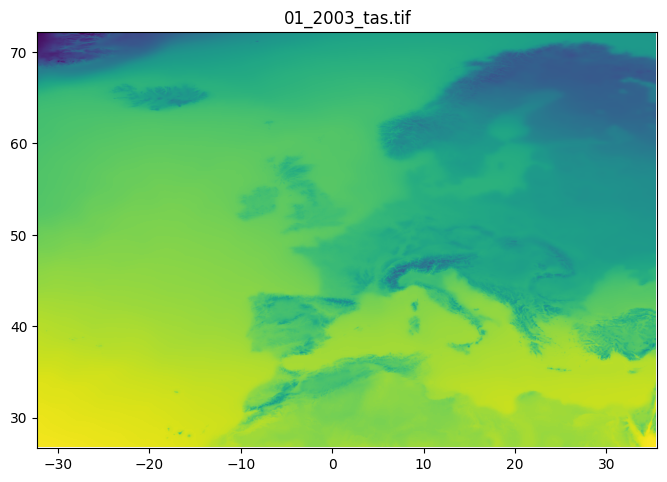

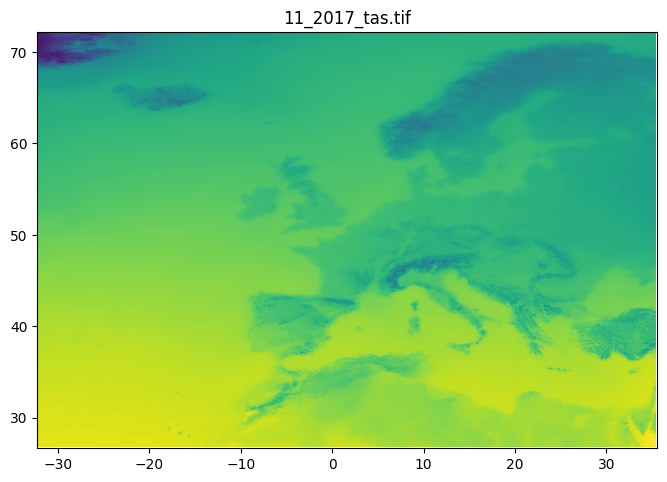

In [5]:
# plot raster file
for i,raster_path in enumerate(climatic_raster_path_list[:2]):
    with rasterio.open(raster_path) as src:
        plt.figure(figsize = [8,8])
        plt.title(raster_path.split("/")[-1])
        show(src)

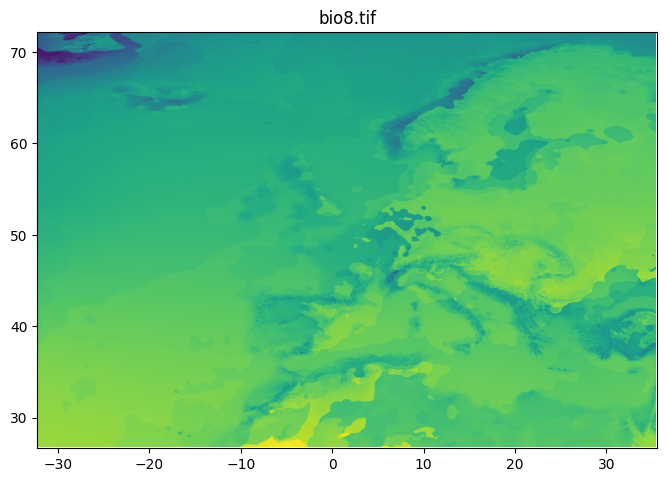

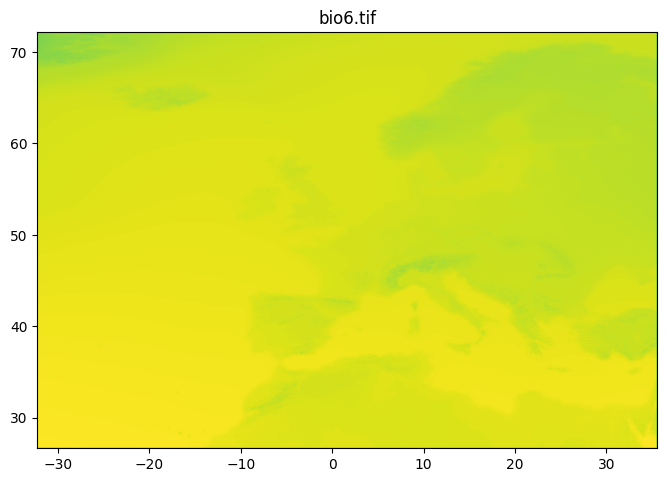

In [6]:
# plot raster file
for i,raster_path in enumerate(bio_raster_path_list[:2]):
    with rasterio.open(raster_path) as src:
        plt.figure(figsize = [8,8])
        plt.title(raster_path.split("/")[-1])
        show(src)

In [7]:
# visualize every monitoring site in meta data
# Example for 1000 samples
# Read meta data
train_meta = pd.read_csv(root_path + "/geolifeclef-2024/GLC24_PA_metadata_train.csv")
train_meta.head()

sub_train_meta = train_meta.drop_duplicates('surveyId').sample(n=1000, random_state=42)
sub_train_meta.index = range(len(sub_train_meta))

# make Point vector 
point_list = []
for i in tqdm.tqdm(range(len(sub_train_meta))):
    x,y = sub_train_meta.loc[i, ['lon', 'lat']]
    poind_i = Point(x,y)
    point_list.append(poind_i)

sub_train_meta.loc[:,'geometry'] = point_list

# Read meta data
test_meta = pd.read_csv(root_path + "/geolifeclef-2024/GLC24_PA_metadata_test.csv")
test_meta.head()

sub_test_meta = test_meta.drop_duplicates('surveyId').sample(n=1000, random_state=42)
sub_test_meta.index = range(len(sub_test_meta))

# make Point vector 
point_list = []
for i in tqdm.tqdm(range(len(sub_test_meta))):
    x,y = sub_test_meta.loc[i, ['lon', 'lat']]
    poind_i = Point(x,y)
    point_list.append(poind_i)

sub_test_meta.loc[:,'geometry'] = point_list

100%|██████████| 1000/1000 [00:00<00:00, 2032.84it/s]
/opt/conda/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:131: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
100%|██████████| 1000/1000 [00:00<00:00, 2158.38it/s]
/opt/conda/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:131: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [8]:
train_sub_meta_gdf = gpd.GeoDataFrame(sub_train_meta, geometry = 'geometry')
train_sub_meta_gdf.crs = {'init':'epsg:4326'} 
train_sub_meta_gdf.head()

test_sub_meta_gdf = gpd.GeoDataFrame(sub_test_meta, geometry = 'geometry')
test_sub_meta_gdf.crs = {'init':'epsg:4326'} 
test_sub_meta_gdf.head()

# visualize each monitoring site
m = train_sub_meta_gdf.drop_duplicates(['lon', 'lat']).explore(color = 'green')
test_sub_meta_gdf.drop_duplicates(['lon', 'lat']).explore(m=m, color = 'red')

/opt/conda/lib/python3.10/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/opt/conda/lib/python3.10/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


<Axes: >

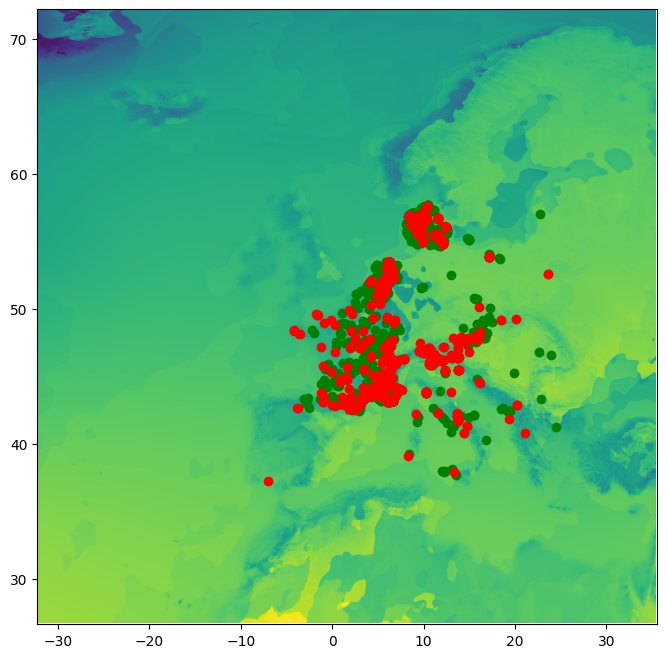

In [9]:
# visualize with raster file
fig, ax = plt.subplots(figsize=(8, 8))

raster_path = bio_raster_path_list[0]
with rasterio.open(raster_path) as src:
    show(src, ax=ax)
train_sub_meta_gdf.drop_duplicates(['lon', 'lat']).plot(ax=ax,color = 'green')
test_sub_meta_gdf.drop_duplicates(['lon', 'lat']).plot(ax=ax,color = 'red')

In [11]:
test_meta.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,surveyId
0,10.033550,57.12081,2019,10.0,707.0,CONTINENTAL,Denmark,642
1,7.333000,46.22997,2019,NaN,10.0,ALPINE,Switzerland,1792
2,1.843658,42.58006,2018,0.0,-inf,ALPINE,France,3256
3,11.720090,46.26149,2021,10.0,35.0,ALPINE,Italy,3855
4,9.361870,55.90245,2017,10.0,79.0,CONTINENTAL,Denmark,4889


In [14]:
# merge raster data with meta data
%time
# two raster file example
train_geo_info_gdf = train_sub_meta_gdf.drop_duplicates(['lon', 'lat'])
train_geo_info_gdf.index = range(len(train_geo_info_gdf))

test_geo_info_gdf = test_sub_meta_gdf.drop_duplicates(['lon', 'lat'])
test_geo_info_gdf.index = range(len(test_geo_info_gdf))

for raster_path in tqdm.tqdm(bio_raster_path_list[:2]):
    bio_raster = rasterio.open(raster_path)
    
    bio_values = zonal_stats(vectors=train_geo_info_gdf.geometry,raster=bio_raster.read(1), affine=bio_raster.transform,stats=['mean'])
    bio_values_list = [value['mean'] for value in bio_values]
    feature_name = raster_path.split("/")[-1].split(".")[0]
    train_geo_info_gdf.loc[:,feature_name] = bio_values_list
    
    bio_values = zonal_stats(vectors=test_geo_info_gdf.geometry,raster=bio_raster.read(1), affine=bio_raster.transform,stats=['mean'])
    bio_values_list = [value['mean'] for value in bio_values]
    feature_name = raster_path.split("/")[-1].split(".")[0]
    test_geo_info_gdf.loc[:,feature_name] = bio_values_list

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.87 µs


  0%|          | 0/2 [00:00<?, ?it/s]/opt/conda/lib/python3.10/site-packages/rasterstats/io.py:328: NodataWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
 50%|█████     | 1/2 [00:03<00:03,  3.44s/it]/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem

In [15]:
train_geo_info_gdf.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,speciesId,surveyId,geometry,bio8,bio6
0,10.190520,56.26073,2017,10.0,79.0,CONTINENTAL,Denmark,8439.0,2539246,POINT (10.19052 56.26073),2859.0,2720.0
1,3.671620,45.58282,2018,1.0,NaN,CONTINENTAL,France,9707.0,2398267,POINT (3.67162 45.58282),2837.0,2703.0
2,5.891821,52.02833,2020,3.0,9.0,ATLANTIC,Netherlands,10317.0,2103781,POINT (5.89182 52.02833),2772.0,2733.0
3,9.107600,55.90548,2019,10.0,79.0,ATLANTIC,Denmark,9024.0,924087,POINT (9.10760 55.90548),2857.0,2718.0
4,9.467830,56.93755,2017,10.0,79.0,CONTINENTAL,Denmark,5189.0,568748,POINT (9.46783 56.93755),2861.0,2724.0


In [16]:
test_geo_info_gdf.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,surveyId,geometry,bio8,bio6
0,9.24172,56.62617,2018,10.0,79.0,CONTINENTAL,Denmark,981011,POINT (9.24172 56.62617),2862.0,2726.0
1,4.21332,46.43899,2017,1.0,NaN,CONTINENTAL,France,1691277,POINT (4.21332 46.43899),2847.0,2733.0
2,9.29359,55.88637,2019,10.0,79.0,ATLANTIC,Denmark,2626337,POINT (9.29359 55.88637),2855.0,2716.0
3,10.24700,43.84580,2018,3.0,4.0,MEDITERRANEAN,Italy,3068155,POINT (10.24700 43.84580),2901.0,2799.0
4,6.23010,43.11910,2020,10.0,1.0,MEDITERRANEAN,France,1866154,POINT (6.23010 43.11910),2864.0,2784.0


In [ ]:
# Dataset merge

In [17]:
train_meta = pd.read_csv(root_path + "/geolifeclef-2024/GLC24_PA_metadata_train.csv")

In [18]:
%time
# read average landsat dataset
# Simply merge; this set has no missing values.
train_bioclimatic = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/Climate/Average 1981-2010/GLC24-PA-train-bioclimatic.csv")
train_bioclimatic_monthly = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/Climate/Monthly/GLC24-PA-train-bioclimatic_monthly.csv")
train_elevation = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/Elevation/GLC24-PA-train-elevation.csv")
train_human_footprint = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/Human Footprint/GLC24-PA-train-human_footprint.csv")
train_land_cover = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/LandCover/GLC24-PA-train-landcover.csv")
train_soilgrid = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/SoilGrids/GLC24-PA-train-soilgrids.csv")

# first merge bioclimatic averate dataset
merge_key = 'surveyId'

# merge tables
train_merged = pd.merge(train_bioclimatic, train_bioclimatic_monthly, on=merge_key)
train_merged = pd.merge(train_merged, train_elevation, on=merge_key)
train_merged = pd.merge(train_merged, train_human_footprint, on=merge_key)
train_merged = pd.merge(train_merged, train_land_cover, on=merge_key)
train_merged = pd.merge(train_merged, train_soilgrid, on=merge_key)

train_merged

CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 7.39 µs


,surveyId,Bio1,Bio2,Bio3,Bio4,Bio5,Bio6,Bio7,Bio8,Bio9,...,LandCover,Soilgrid-bdod,Soilgrid-cec,Soilgrid-cfvo,Soilgrid-clay,Soilgrid-nitrogen,Soilgrid-phh2o,Soilgrid-sand,Soilgrid-silt,Soilgrid-soc
0,212,2883,68,3,5545,3007,2780,227,2854,2958,...,8.0,140.0,214.0,151.0,292.0,159.0,73.0,284.0,422.0,176.0
1,222,2815,59,2,5690,2935,2720,215,2860,2768,...,12.0,120.0,225.0,101.0,94.0,379.0,58.0,650.0,255.0,609.0
2,243,2821,26,1,5150,2910,2741,169,2838,2832,...,5.0,115.0,261.0,86.0,131.0,373.0,54.0,750.0,117.0,672.0
3,324,2870,90,3,5315,2992,2756,236,2810,2938,...,14.0,118.0,179.0,117.0,225.0,230.0,57.0,238.0,535.0,302.0
4,333,2858,81,3,5285,2982,2758,224,2827,2927,...,14.0,138.0,233.0,176.0,328.0,250.0,71.0,231.0,439.0,257.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88982,3919553,2817,30,1,5398,2913,2734,179,2864,2767,...,12.0,116.0,199.0,65.0,116.0,311.0,59.0,622.0,260.0,485.0
88983,3919592,2812,19,1,5540,2909,2734,175,2833,2781,...,1.0,118.0,245.0,113.0,156.0,405.0,54.0,555.0,288.0,868.0
88984,3919620,2815,59,2,5564,2931,2722,209,2860,2803,...,12.0,113.0,233.0,70.0,71.0,253.0,56.0,798.0,129.0,414.0
88985,3919640,2808,66,2,6775,2945,2693,252,2895,2759,...,1.0,130.0,162.0,99.0,55.0,234.0,50.0,803.0,141.0,502.0


In [19]:
# landsat time series missing value check
landsat_example = pd.read_csv(root_path + f"/geolifeclef-2024/PA-train-landsat_time_series/GLC24-PA-train-landsat_time_series-blue.csv")
landsat_example.head() ## missing value!

,surveyId,2000_1,2000_2,2000_3,2000_4,2001_1,2001_2,2001_3,2001_4,2002_1,...,2018_3,2018_4,2019_1,2019_2,2019_3,2019_4,2020_1,2020_2,2020_3,2020_4
0,212,6.0,6.0,4.0,5.0,6.0,5.0,4.0,5.0,6.0,...,7.0,6.0,7.0,6.0,8.0,6.0,7.0,6.0,6.0,6.0
1,222,6.0,5.0,6.0,7.0,6.0,7.0,6.0,7.0,6.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,243,6.0,5.0,6.0,9.0,5.0,4.0,5.0,6.0,6.0,...,5.0,4.0,8.0,3.0,4.0,4.0,NaN,NaN,NaN,NaN
3,324,12.0,16.0,6.0,5.0,11.0,19.0,6.0,8.0,11.0,...,6.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,333,10.0,7.0,12.0,7.0,11.0,23.0,27.0,12.0,8.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
# We merge climatic timeseries data within a 10-year time window.(4 q * 10 years = 40)
# For example, if the survey year was 2018, we merge monthly data from the years 2008 to 2017.

def shift_and_slice(array):
    for i in range(len(array)):
        row = array[i]
        nan_indices = np.isnan(row)

        rightmost_nan_index = np.argmax(nan_indices)

        if np.any(nan_indices):
            shifted_row = np.roll(row, len(row) - rightmost_nan_index)
            array[i] = shifted_row
    
    return array[:,-(4 * 10):]

In [21]:
for monthly_landsat_data in tqdm.tqdm(['blue', 'green', 'red', 'nir', 'swir1', 'swir2']):
    landsat_timeseries = pd.read_csv(root_path + f"/geolifeclef-2024/PA-train-landsat_time_series/GLC24-PA-train-landsat_time_series-{monthly_landsat_data}.csv")
    origin_arr = landsat_timeseries.iloc[:,1:].values
    new_arr = shift_and_slice(origin_arr)
    
    window_dataset =  landsat_timeseries.iloc[:,0:1]
    window_dataset.loc[:,[f'{monthly_landsat_data}_t-{i+1}' for i in range(40)]] = new_arr
    
    train_merged = pd.merge(train_merged, window_dataset, on=merge_key)

100%|██████████| 6/6 [00:25<00:00,  4.30s/it]


In [22]:
train_merged

,surveyId,Bio1,Bio2,Bio3,Bio4,Bio5,Bio6,Bio7,Bio8,Bio9,...,swir2_t-31,swir2_t-32,swir2_t-33,swir2_t-34,swir2_t-35,swir2_t-36,swir2_t-37,swir2_t-38,swir2_t-39,swir2_t-40
0,212,2883,68,3,5545,3007,2780,227,2854,2958,...,17.0,13.0,9.0,17.0,16.0,13.0,11.0,21.0,15.0,13.0
1,222,2815,59,2,5690,2935,2720,215,2860,2768,...,28.0,26.0,20.0,20.0,30.0,27.0,22.0,23.0,27.0,27.0
2,243,2821,26,1,5150,2910,2741,169,2838,2832,...,8.0,15.0,9.0,6.0,7.0,11.0,9.0,1.0,8.0,12.0
3,324,2870,90,3,5315,2992,2756,236,2810,2938,...,17.0,23.0,40.0,42.0,15.0,35.0,24.0,19.0,18.0,17.0
4,333,2858,81,3,5285,2982,2758,224,2827,2927,...,64.0,42.0,44.0,52.0,32.0,52.0,33.0,57.0,21.0,43.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88982,3919553,2817,30,1,5398,2913,2734,179,2864,2767,...,25.0,23.0,29.0,32.0,23.0,21.0,32.0,21.0,19.0,27.0
88983,3919592,2812,19,1,5540,2909,2734,175,2833,2781,...,14.0,10.0,13.0,16.0,12.0,12.0,9.0,14.0,13.0,11.0
88984,3919620,2815,59,2,5564,2931,2722,209,2860,2803,...,25.0,31.0,35.0,27.0,33.0,27.0,31.0,23.0,26.0,32.0
88985,3919640,2808,66,2,6775,2945,2693,252,2895,2759,...,9.0,5.0,9.0,11.0,12.0,7.0,9.0,7.0,11.0,7.0


In [23]:
%time
# species id range from 1 to 11254
print(np.max(train_meta.drop_duplicates('speciesId').loc[:,['speciesId']].values), np.min(train_meta.drop_duplicates('speciesId').loc[:,['speciesId']].values))
species_target_columns = [str(sp_id) for sp_id in range(1,11255)]
input_columns = train_merged.columns.tolist()[1:]

# reshape metadata 
surveyId_list = train_meta.drop_duplicates('surveyId').loc[:,['surveyId']].values
target_arr = np.zeros([len(surveyId_list),11254])
for i,survey_id in tqdm.tqdm(enumerate(surveyId_list)):
    presense_species_ids = train_meta.loc[train_meta.surveyId == survey_id[0],'speciesId'].values
    target_arr[i,[int(ids)-1 for ids in presense_species_ids]] = 1

train_target_df = pd.DataFrame(target_arr)
train_target_df.columns = species_target_columns
train_target_df.loc[:,'surveyId'] = surveyId_list
train_target_df

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs
11254.0 2.0


88987it [02:17, 645.72it/s]


,1,2,3,4,5,6,7,8,9,10,...,11246,11247,11248,11249,11250,11251,11252,11253,11254,surveyId
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,212
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,222
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,243
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,324
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88982,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3919553
88983,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3919592
88984,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3919620
88985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3919640


In [24]:
# check missing values
missing_value_col_list = []
rows_with_missing_values = {}
for column in train_merged.columns:
    missing_rows = train_merged.index[train_merged[column].isnull()].tolist()
    if len(missing_rows) > 0:
        rows_with_missing_values[column] = len(missing_rows)
        missing_value_col_list.append(column)

print(rows_with_missing_values)

{'Elevation': 35, 'HumanFootprint-NavWater1994': 5325, 'HumanFootprint-NavWater2009': 5325, 'HumanFootprint-Roads': 5325, 'HumanFootprint-HFP1993': 5325, 'HumanFootprint-HFP2009': 5325, 'Soilgrid-bdod': 8573, 'Soilgrid-cec': 7512, 'Soilgrid-cfvo': 7512, 'Soilgrid-clay': 7512, 'Soilgrid-nitrogen': 7512, 'Soilgrid-phh2o': 7512, 'Soilgrid-sand': 7512, 'Soilgrid-silt': 7512, 'Soilgrid-soc': 8573}


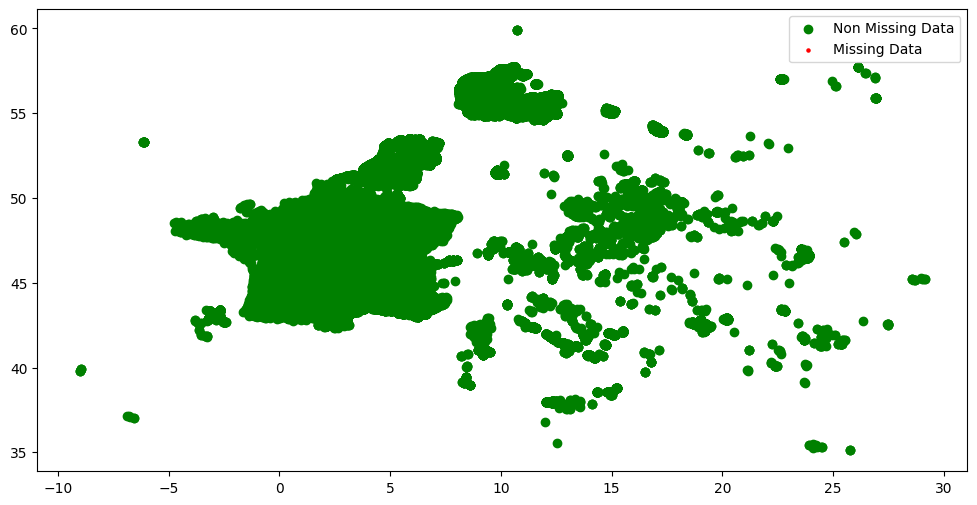

In [25]:
# check missing value region
target_colname = 'swir2_t-39'
sub_df = pd.merge(train_merged.loc[:, ['surveyId', target_colname]], train_meta.loc[:, ['lon', 'lat', 'surveyId']].drop_duplicates("surveyId"), on='surveyId')
na_ind = sub_df.loc[:,target_colname].isna().values

sub_df_train = sub_df.loc[~na_ind,:]
sub_df_target = sub_df.loc[na_ind,:]
x,y,z = sub_df_train['lon'].values, sub_df_train['lat'].values, sub_df_train[target_colname].values
x_target,y_target,z_target = sub_df_target['lon'].values, sub_df_target['lat'].values, np.zeros(sub_df_target[target_colname].shape)

plt.figure(figsize=(12, 6))
plt.scatter(x, y, marker='o', color='green', label='Non Missing Data')
plt.scatter(x_target, y_target, marker='o', color='red', label='Missing Data', s = 5)

plt.legend()
plt.show()

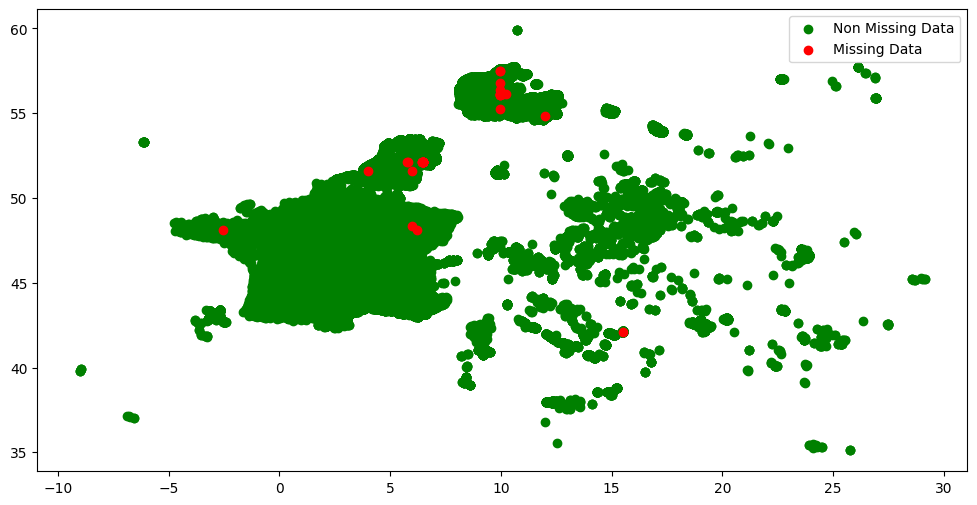

In [26]:
# check missing value region
target_colname = 'Elevation'
sub_df = pd.merge(train_merged.loc[:, ['surveyId', target_colname]], train_meta.loc[:, ['lon', 'lat', 'surveyId']].drop_duplicates("surveyId"), on='surveyId')
na_ind = sub_df.loc[:,target_colname].isna().values

sub_df_train = sub_df.loc[~na_ind,:]
sub_df_target = sub_df.loc[na_ind,:]
x,y,z = sub_df_train['lon'].values, sub_df_train['lat'].values, sub_df_train[target_colname].values
x_target,y_target,z_target = sub_df_target['lon'].values, sub_df_target['lat'].values, np.zeros(sub_df_target[target_colname].shape)

plt.figure(figsize=(12, 6))
plt.scatter(x, y, marker='o', color='green', label='Non Missing Data')
plt.scatter(x_target, y_target, marker='o', color='red', label='Missing Data')

plt.legend()
plt.show()

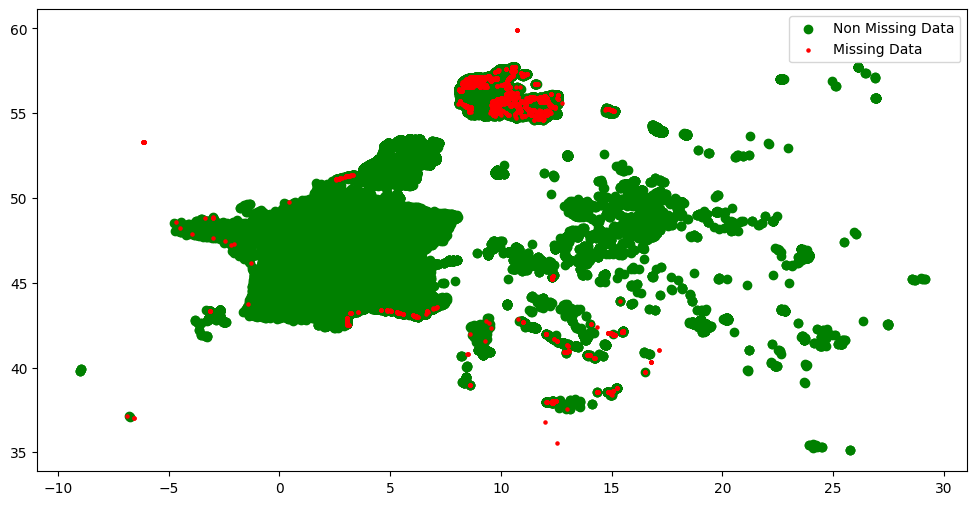

In [27]:
# check missing value region
target_colname = 'HumanFootprint-Roads'
sub_df = pd.merge(train_merged.loc[:, ['surveyId', target_colname]], train_meta.loc[:, ['lon', 'lat', 'surveyId']].drop_duplicates("surveyId"), on='surveyId')
na_ind = sub_df.loc[:,target_colname].isna().values

sub_df_train = sub_df.loc[~na_ind,:]
sub_df_target = sub_df.loc[na_ind,:]
x,y,z = sub_df_train['lon'].values, sub_df_train['lat'].values, sub_df_train[target_colname].values
x_target,y_target,z_target = sub_df_target['lon'].values, sub_df_target['lat'].values, np.zeros(sub_df_target[target_colname].shape)

plt.figure(figsize=(12, 6))
plt.scatter(x, y, marker='o', color='green', label='Non Missing Data')
plt.scatter(x_target, y_target, marker='o', color='red', label='Missing Data', s = 5)

plt.legend()
plt.show()

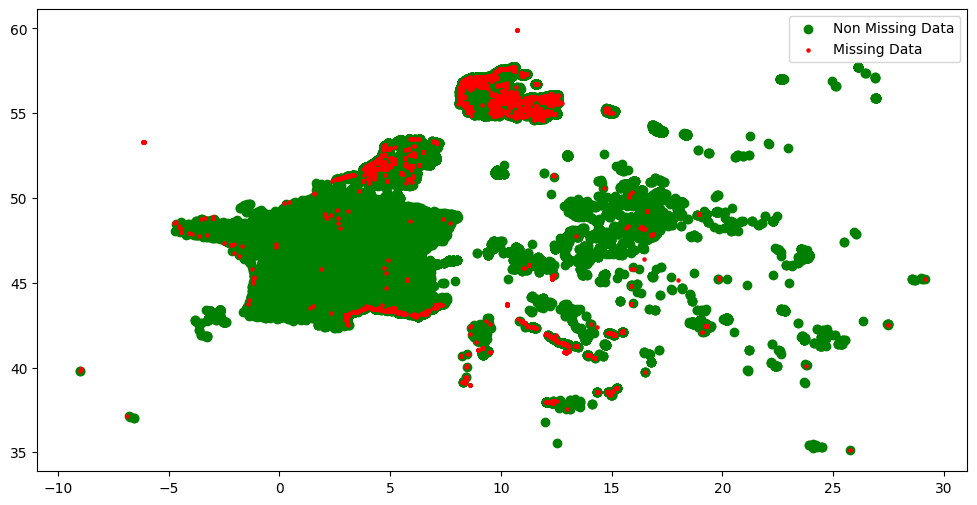

In [28]:
# check missing value region
target_colname = 'Soilgrid-bdod'
sub_df = pd.merge(train_merged.loc[:, ['surveyId', target_colname]], train_meta.loc[:, ['lon', 'lat', 'surveyId']].drop_duplicates("surveyId"), on='surveyId')
na_ind = sub_df.loc[:,target_colname].isna().values

sub_df_train = sub_df.loc[~na_ind,:]
sub_df_target = sub_df.loc[na_ind,:]
x,y,z = sub_df_train['lon'].values, sub_df_train['lat'].values, sub_df_train[target_colname].values
x_target,y_target,z_target = sub_df_target['lon'].values, sub_df_target['lat'].values, np.zeros(sub_df_target[target_colname].shape)

plt.figure(figsize=(12, 6))
plt.scatter(x, y, marker='o', color='green', label='Non Missing Data')
plt.scatter(x_target, y_target, marker='o', color='red', label='Missing Data', s = 5)

plt.legend()
plt.show()

In [29]:

%time
# missing_value_col_list
for target_colname in tqdm.tqdm(missing_value_col_list):

    sub_df = pd.merge(train_merged.loc[:, ['surveyId', target_colname]], train_meta.loc[:, ['lon', 'lat', 'surveyId']].drop_duplicates("surveyId"), on='surveyId')
    na_ind_bool = sub_df.loc[:,target_colname].isna().values

    na_ind = sub_df.index[na_ind_bool]
    no_na_ind = sub_df.index[~na_ind_bool]



    given_points = sub_df.iloc[no_na_ind,[2,3]].values

    for na_ind_i in na_ind:

        target_point = sub_df.iloc[na_ind_i,[2,3]].values
        distances = np.linalg.norm(given_points - target_point, axis=1)
        closest_index = no_na_ind[np.argmin(distances)]
        closest_value = sub_df.iloc[closest_index,1]
        train_merged.loc[na_ind_i, target_colname] = closest_value

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.39 µs


100%|██████████| 15/15 [01:47<00:00,  7.20s/it]


In [30]:
# check missing values
rows_with_missing_values = {}
for column in train_merged.columns:
    missing_rows = train_merged.index[train_merged[column].isnull()].tolist()
    if len(missing_rows) > 0:
        rows_with_missing_values[column] = len(missing_rows)
print(rows_with_missing_values)

{}


In [31]:
# check -inf values
columns_with_negative_inf = train_merged.columns[train_merged.apply(lambda col: any(col == float('-inf')))]
if len(columns_with_negative_inf) > 0:
    print("This column contains a value of -inf")
    for column_name in columns_with_negative_inf:
        print(column_name)
else:
    print("no inf value")

This column contains a value of -inf
HumanFootprint-Roads


In [32]:
# Replace -inf with zero.
train_merged.replace({float('-inf'): 0}, inplace=True)

# check -inf values
columns_with_negative_inf = train_merged.columns[train_merged.apply(lambda col: any(col == float('-inf')))]
if len(columns_with_negative_inf) > 0:
    print("This column contains a value of -inf")
    for column_name in columns_with_negative_inf:
        print(column_name)
else:
    print("no inf value")

no inf value


In [33]:
%time
# read average landsat dataset
# Simply merge; this set has no missing values.
test_bioclimatic = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/Climate/Average 1981-2010/GLC24-PA-test-bioclimatic.csv")
test_bioclimatic_monthly = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/Climate/Monthly/GLC24-PA-test-bioclimatic_monthly.csv")
test_elevation = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/Elevation/GLC24-PA-test-elevation.csv")
test_human_footprint = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/Human Footprint/GLC24-PA-test-human_footprint.csv")
test_land_cover = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/LandCover/GLC24-PA-test-landcover.csv")
test_soilgrid = pd.read_csv(root_path + "/geolifeclef-2024/EnvironmentalRasters/EnvironmentalRasters/SoilGrids/GLC24-PA-test-soilgrids.csv")


# first merge bioclimatic averate dataset
merge_key = 'surveyId'

# merge tables
test_merged = pd.merge(test_bioclimatic, test_bioclimatic_monthly, on=merge_key)
test_merged = pd.merge(test_merged, test_elevation, on=merge_key)
test_merged = pd.merge(test_merged, test_human_footprint, on=merge_key)
test_merged = pd.merge(test_merged, test_land_cover, on=merge_key)
test_merged = pd.merge(test_merged, test_soilgrid, on=merge_key)

test_merged

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.63 µs


,surveyId,Bio1,Bio2,Bio3,Bio4,Bio5,Bio6,Bio7,Bio8,Bio9,...,LandCover,Soilgrid-bdod,Soilgrid-cec,Soilgrid-cfvo,Soilgrid-clay,Soilgrid-nitrogen,Soilgrid-phh2o,Soilgrid-sand,Soilgrid-silt,Soilgrid-soc
0,642,2814,57,2,5717,2934,2720,214,2859,2767,...,9.0,114.0,229.0,96.0,95.0,389.0,48.0,634.0,270.0,891.0
1,1792,2826,104,3,7607,2975,2666,309,2922,2780,...,10.0,126.0,204.0,156.0,238.0,259.0,68.0,349.0,411.0,311.0
2,3256,2735,93,3,6168,2876,2611,265,2755,2669,...,10.0,109.0,246.0,193.0,210.0,547.0,59.0,370.0,419.0,717.0
3,3855,2739,95,3,7129,2880,2583,297,2811,2661,...,10.0,112.0,252.0,195.0,189.0,489.0,60.0,375.0,435.0,571.0
4,4889,2809,62,2,5603,2928,2715,213,2854,2797,...,5.0,113.0,146.0,86.0,96.0,220.0,53.0,751.0,153.0,421.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4711,3915838,2835,71,3,5575,2958,2735,223,2802,2795,...,9.0,121.0,132.0,71.0,120.0,411.0,57.0,636.0,243.0,283.0
4712,3916502,2836,44,2,4844,2931,2752,179,2849,2794,...,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4713,3917793,2817,80,2,6979,2958,2687,271,2907,2727,...,4.0,119.0,220.0,173.0,261.0,272.0,54.0,294.0,444.0,384.0
4714,3918865,2816,46,2,6023,2933,2721,212,2896,2765,...,10.0,129.0,219.0,80.0,170.0,323.0,59.0,568.0,261.0,386.0


In [34]:
# We merge climatic timeseries data within a 10-year time window.(4 q * 10 years = 40)
# For example, if the survey year was 2018, we merge monthly data from the years 2008 to 2017.
for monthly_landsat_data in tqdm.tqdm(['blue', 'green', 'red', 'nir', 'swir1', 'swir2']):
    landsat_timeseries = pd.read_csv(root_path + f"/geolifeclef-2024/PA-test-landsat_time_series/GLC24-PA-test-landsat_time_series-{monthly_landsat_data}.csv")
    origin_arr = landsat_timeseries.iloc[:,1:].values
    new_arr = shift_and_slice(origin_arr)
    
    window_dataset =  landsat_timeseries.iloc[:,0:1]
    window_dataset.loc[:,[f'{monthly_landsat_data}_t-{i+1}' for i in range(40)]] = new_arr
    
    test_merged = pd.merge(test_merged, window_dataset, on=merge_key)

100%|██████████| 6/6 [00:01<00:00,  4.04it/s]


In [35]:
test_merged

,surveyId,Bio1,Bio2,Bio3,Bio4,Bio5,Bio6,Bio7,Bio8,Bio9,...,swir2_t-31,swir2_t-32,swir2_t-33,swir2_t-34,swir2_t-35,swir2_t-36,swir2_t-37,swir2_t-38,swir2_t-39,swir2_t-40
0,642,2814,57,2,5717,2934,2720,214,2859,2767,...,26.0,31.0,32.0,26.0,18.0,27.0,35.0,26.0,24.0,24.0
1,1792,2826,104,3,7607,2975,2666,309,2922,2780,...,49.0,56.0,13.0,26.0,27.0,15.0,14.0,20.0,26.0,18.0
2,3256,2735,93,3,6168,2876,2611,265,2755,2669,...,38.0,46.0,17.0,44.0,36.0,36.0,16.0,17.0,38.0,42.0
3,3855,2739,95,3,7129,2880,2583,297,2811,2661,...,34.0,52.0,27.0,34.0,35.0,52.0,27.0,36.0,35.0,62.0
4,4889,2809,62,2,5603,2928,2715,213,2854,2797,...,13.0,16.0,2.0,15.0,21.0,16.0,10.0,23.0,15.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4711,3915838,2835,71,3,5575,2958,2735,223,2802,2795,...,20.0,27.0,24.0,17.0,20.0,28.0,21.0,20.0,14.0,25.0
4712,3916502,2836,44,2,4844,2931,2752,179,2849,2794,...,16.0,13.0,10.0,6.0,4.0,12.0,14.0,6.0,6.0,16.0
4713,3917793,2817,80,2,6979,2958,2687,271,2907,2727,...,8.0,9.0,9.0,10.0,14.0,7.0,9.0,6.0,9.0,6.0
4714,3918865,2816,46,2,6023,2933,2721,212,2896,2765,...,27.0,27.0,23.0,24.0,21.0,26.0,5.0,12.0,16.0,34.0


In [36]:
# train and prediction example for speciesId 540

In [37]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import xgboost as xgb

In [38]:
# train
tartget_speciesId = '540'

train_df_sub = pd.merge(train_target_df.loc[:,['surveyId', tartget_speciesId]], train_merged, on='surveyId')
train_df_sub.head()

X, y = train_df_sub.iloc[:,2:].values, train_df_sub.iloc[:,1].values
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=7)

(array([67857.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 21130.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

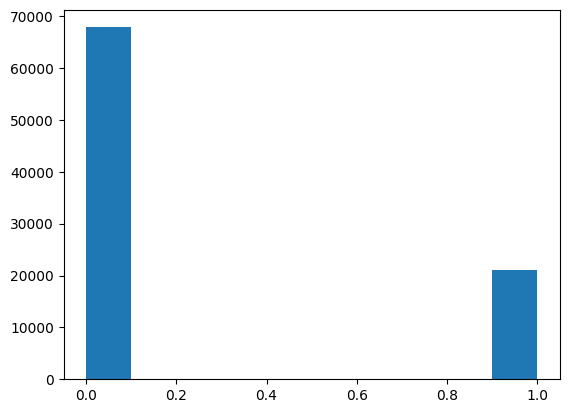

In [39]:
plt.hist(y)

In [40]:
%time
model = XGBClassifier(objective='binary:logistic',eval_metric=['error','logloss'], verbose = 1)
model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], verbose=True,)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.91 µs


/opt/conda/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [14:24:12] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "verbose" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	validation_0-error:0.23587	validation_0-logloss:0.49815
[1]	validation_0-error:0.23576	validation_0-logloss:0.47019
[2]	validation_0-error:0.22250	validation_0-logloss:0.45253
[3]	validation_0-error:0.21407	validation_0-logloss:0.44058
[4]	validation_0-error:0.20744	validation_0-logloss:0.43205
[5]	validation_0-error:0.20407	validation_0-logloss:0.42597
[6]	validation_0-error:0.20351	validation_0-logloss:0.42123
[7]	validation_0-error:0.20317	validation_0-logloss:0.41764
[8]	validation_0-error:0.20227	validation_0-logloss:0.41441
[9]	validation_0-error:0.20036	validation_0-logloss:0.41118
[10]	validation_0-error:0.19935	validation_0-logloss:0.40889
[11]	validation_0-error:0.19710	validation_0-logloss:0.40670
[12]	validation_0-error:0.19811	validation_0-logloss:0.40489
[13]	validation_0-error:0.19699	validation_0-logloss:0.40361
[14]	validation_0-error:0.19575	validation_0-logloss:0.40247
[15]	validation_0-error:0.19508	validation_0-logloss:0.40129
[16]	validation_0-error:0.19485	va

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=['error', 'logloss'],
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [41]:
test_merged

,surveyId,Bio1,Bio2,Bio3,Bio4,Bio5,Bio6,Bio7,Bio8,Bio9,...,swir2_t-31,swir2_t-32,swir2_t-33,swir2_t-34,swir2_t-35,swir2_t-36,swir2_t-37,swir2_t-38,swir2_t-39,swir2_t-40
0,642,2814,57,2,5717,2934,2720,214,2859,2767,...,26.0,31.0,32.0,26.0,18.0,27.0,35.0,26.0,24.0,24.0
1,1792,2826,104,3,7607,2975,2666,309,2922,2780,...,49.0,56.0,13.0,26.0,27.0,15.0,14.0,20.0,26.0,18.0
2,3256,2735,93,3,6168,2876,2611,265,2755,2669,...,38.0,46.0,17.0,44.0,36.0,36.0,16.0,17.0,38.0,42.0
3,3855,2739,95,3,7129,2880,2583,297,2811,2661,...,34.0,52.0,27.0,34.0,35.0,52.0,27.0,36.0,35.0,62.0
4,4889,2809,62,2,5603,2928,2715,213,2854,2797,...,13.0,16.0,2.0,15.0,21.0,16.0,10.0,23.0,15.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4711,3915838,2835,71,3,5575,2958,2735,223,2802,2795,...,20.0,27.0,24.0,17.0,20.0,28.0,21.0,20.0,14.0,25.0
4712,3916502,2836,44,2,4844,2931,2752,179,2849,2794,...,16.0,13.0,10.0,6.0,4.0,12.0,14.0,6.0,6.0,16.0
4713,3917793,2817,80,2,6979,2958,2687,271,2907,2727,...,8.0,9.0,9.0,10.0,14.0,7.0,9.0,6.0,9.0,6.0
4714,3918865,2816,46,2,6023,2933,2721,212,2896,2765,...,27.0,27.0,23.0,24.0,21.0,26.0,5.0,12.0,16.0,34.0


In [42]:
# prediction and mapping species distributions

In [43]:
test_meta = pd.read_csv(root_path + "/geolifeclef-2024/GLC24_PA_metadata_test.csv")
X_test = test_merged.iloc[:,1:].values
y_pred_proba = model.predict_proba(X_test)[:,1]
test_meta.loc[:,tartget_speciesId + "_prob"] = y_pred_proba

In [44]:
test_meta

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,surveyId,540_prob
0,10.033550,57.12081,2019,10.0,707.0,CONTINENTAL,Denmark,642,0.130609
1,7.333000,46.22997,2019,NaN,10.0,ALPINE,Switzerland,1792,0.010362
2,1.843658,42.58006,2018,0.0,-inf,ALPINE,France,3256,0.000052
3,11.720090,46.26149,2021,10.0,35.0,ALPINE,Italy,3855,0.000253
4,9.361870,55.90245,2017,10.0,79.0,CONTINENTAL,Denmark,4889,0.168242
...,...,...,...,...,...,...,...,...,...
4711,5.874027,51.41978,2018,3.0,9.0,ATLANTIC,Netherlands,3915838,0.058981
4712,4.147443,52.01209,2017,3.0,-inf,ATLANTIC,Netherlands,3916502,0.155428
4713,16.029480,48.05149,2017,0.0,400.0,ALPINE,Austria,3917793,0.003805
4714,12.400560,56.09469,2018,10.0,79.0,CONTINENTAL,Denmark,3918865,0.230396


In [45]:
# make Point vector 
point_list = []
for i in tqdm.tqdm(range(len(test_meta))):
    x,y = test_meta.loc[i, ['lon', 'lat']]
    poind_i = Point(x,y)
    point_list.append(poind_i)

test_meta.loc[:,'geometry'] = point_list

100%|██████████| 4716/4716 [00:02<00:00, 2109.27it/s]
/opt/conda/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:131: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [46]:
test_meta_gdf = gpd.GeoDataFrame(test_meta, geometry = 'geometry')
test_meta_gdf.crs = {'init':'epsg:4326'} 

/opt/conda/lib/python3.10/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [47]:
test_meta_gdf.explore(column = tartget_speciesId + "_prob", cmap = 'jet', legend = True)

In [48]:
# feature importance

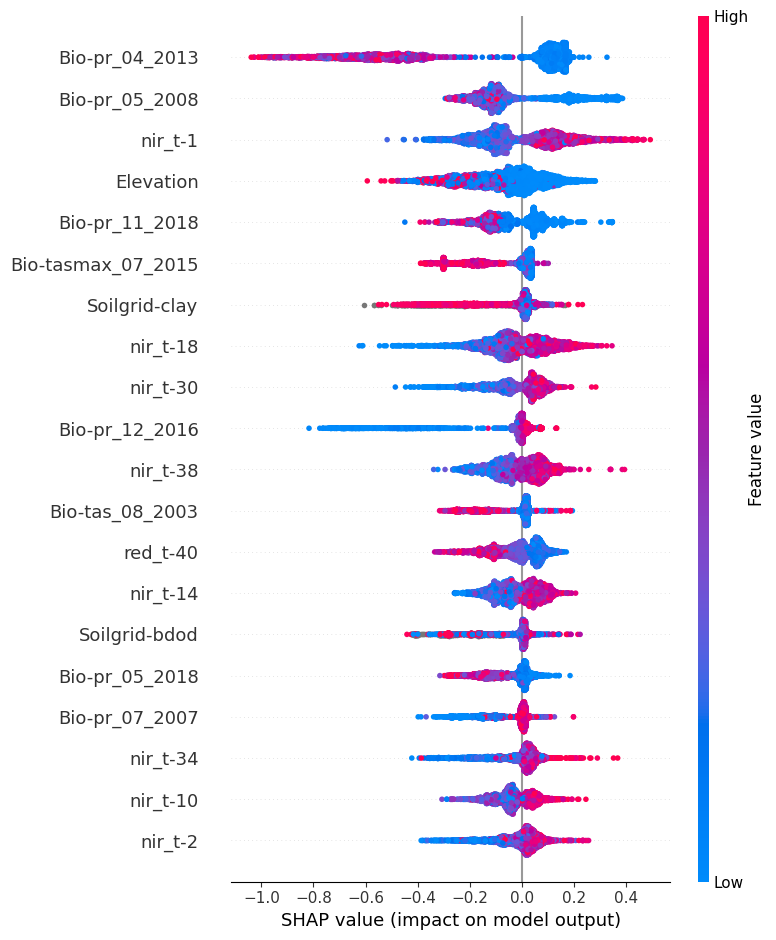

In [49]:
import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer(X_test)
features_col_list = train_merged.columns[1:]

shap.summary_plot(shap_values, X_test, feature_names = features_col_list)

In [50]:
# feature importance map Bio-pr_04_2013

In [51]:
target_feature = 'Bio-pr_04_2013'
feature_shap_values = shap_values[:,features_col_list == target_feature].values

In [52]:
feature_shap_values.shape

(4716, 1)

In [53]:
test_meta_gdf.loc[:,'feature_contribution'] = feature_shap_values

In [54]:
test_meta_gdf.explore(column = 'feature_contribution', cmap = 'jet', legend = True)

In [55]:
# feature importance map elevation

In [56]:
target_feature = 'Elevation'
feature_shap_values = shap_values[:,features_col_list == target_feature].values
test_meta_gdf.loc[:,'feature_contribution'] = feature_shap_values
test_meta_gdf.explore(column = 'feature_contribution', cmap = 'jet', legend = True)